<div style="text-align: center; background: linear-gradient(to right, #1e3a8a, #3b82f6); padding: 30px; border-radius: 15px; box-shadow: 0 4px 12px rgba(0,0,0,0.2);">
  <h1 style="color: white; font-weight: 800; font-size: 32px; margin-bottom: 10px;">
    Evaluating <span style="color: #d1d5db;">Moondream2</span> for Chart & Table Understanding
  </h1>
  <p style="color: #e5e7eb; font-size: 18px; margin: 0;">
    A Practical Assessment on Different Types of Charts and Tables
  </p>
</div>

# Exploring Moondream2 for Chart and Table Understanding 📊🤖

In this notebook, we are going to explore the capabilities of [Moondream2](https://huggingface.co/vikhyatk/moondream2) in understanding charts and tables.  

We will test the model on **different types of charts** to see how well it can:  
- Generate captions for images  
- Extract data and convert charts into **structured tables**  
- Provide **detailed explanations** using the numerical values present in the charts and tables

Through this exploration, we aim to understand the model's strengths and limitations when working with visual data and chart analysis.

# **1. Import Libraries**

In [1]:
from transformers import AutoModelForCausalLM, AutoTokenizer
from PIL import Image
from IPython.display import display, HTML

# **2. Load `vikhyatk/moondream2`**

In [2]:
model = AutoModelForCausalLM.from_pretrained(
    "vikhyatk/moondream2",
    revision="2025-06-21",
    trust_remote_code=True,
    device_map={"": "cuda"}  # ...or 'mps', on Apple Silicon
)

config.json:   0%|          | 0.00/277 [00:00<?, ?B/s]

hf_moondream.py: 0.00B [00:00, ?B/s]

image_crops.py: 0.00B [00:00, ?B/s]

text.py: 0.00B [00:00, ?B/s]

config.py: 0.00B [00:00, ?B/s]

layers.py: 0.00B [00:00, ?B/s]

rope.py: 0.00B [00:00, ?B/s]

moondream.py: 0.00B [00:00, ?B/s]

region.py: 0.00B [00:00, ?B/s]

vision.py: 0.00B [00:00, ?B/s]

lora.py: 0.00B [00:00, ?B/s]

utils.py: 0.00B [00:00, ?B/s]

2025-09-01 09:05:42.878596: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1756717543.206016      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1756717543.295766      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


model.safetensors:   0%|          | 0.00/3.85G [00:00<?, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

generation_config.json:   0%|          | 0.00/69.0 [00:00<?, ?B/s]

# **3. Inference**

In [3]:
# Helper function for styled prints with larger text
def print_styled(text, color="black", size=18):
    display(HTML(f"<span style='color:{color}; font-size:{size}px'>{text}</span>"))

def analyze_image(image_path, 
                  model,
                  visual_query_1,
                  visual_query_2
                 ):
    # Separation line
    display(HTML("<hr>"))
    
    # Print before displaying image
    print_styled(f"🖼️ Displaying image: {image_path}", "purple", size=20)
    
    # Load and display image
    image = Image.open(image_path).convert("RGB")
    display(image)
    
    # Separation line
    display(HTML("<hr>"))
    
    # Short caption 📝
    print_styled("📝 Short caption:", "red", size=18)
    print(model.caption(image, length="short")["caption"])
    
    # Separation line
    display(HTML("<hr>"))
    
    # Normal caption 📖
    print_styled("📖 Normal caption (streaming):", "green", size=18)
    for t in model.caption(image, length="normal", stream=True)["caption"]:
        print(t, end="", flush=True)
    print()  # newline after stream
    
    # Separation line
    display(HTML("<hr>"))
    
    # Visual query 1 📊
    print_styled(f"📊 Visual query: {visual_query_1}", "blue", size=18)
    print(model.query(image, visual_query_1)["answer"])
    
    # Separation line
    display(HTML("<hr>"))
    
    # Visual query 2 🔎
    print_styled(f"🔎 Visual query: {visual_query_2}", "purple", size=18)
    print(model.query(image, visual_query_2)["answer"])
    
    # Final separation line
    display(HTML("<hr>"))

## **Example n°1**

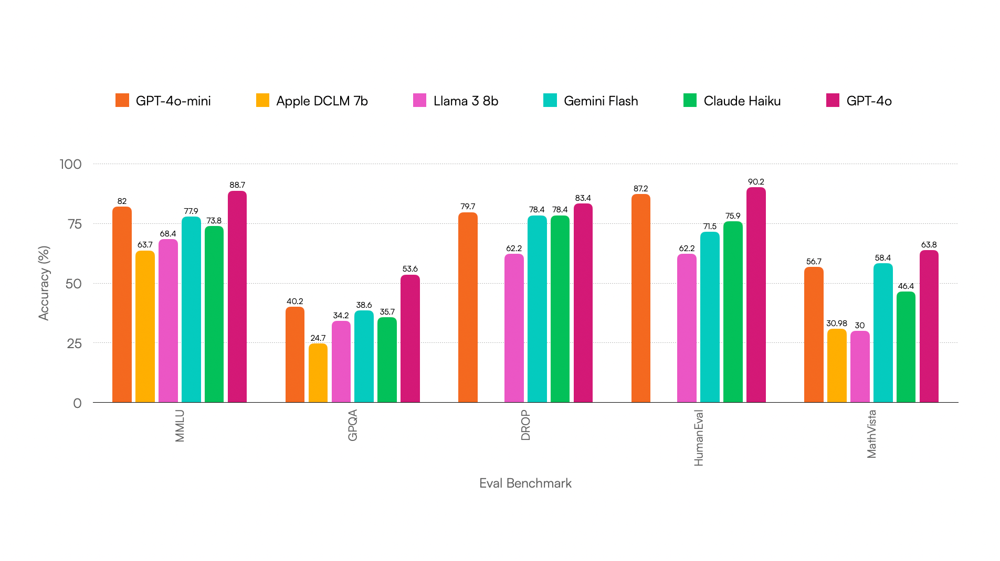

The chart compares the accuracy of different facial recognition systems, including GPT-4o, MMLU, DROP, HumanEval, Claude Haiku, Apple DCLM 7b, Geoffrey Hinton, and MatVista, on various evaluation metrics.


The chart presents a comparison of accuracy rates between various evaluation metrics for object detection algorithms. The metrics considered are GPT-4o mini, Apple DCLM 7b, Llama 3 8b, Gemini Flash, Claude Haiku, and HumanEval. The chart is organized in a horizontal bar chart format, with each bar representing a algorithm and its corresponding accuracy rate. The bars are color-coded for easy differentiation. The accuracy rates are displayed for five different datasets: MMLU, DROP, HumanEval, MathVista, and GPT-4o. The chart also includes a vertical axis to represent the accuracy percentage and a horizontal axis to represent the evaluation metric. 

The chart reveals that GPT-4o mini exhibits the highest accuracy across all evaluation metrics, followed by HumanEval. Claude Haiku also demonstrates high accuracy, with slightly lower rates compared to other algorithms. The accuracy of GMNI Flash and MathVista is relatively close, with GMNI Flash having a slightly higher rate. Apple DCLM 7b

| Eval Benchmark | GPT-4o | Apple DCLM 7b | Llama 3 8b | Gemini Flash | Claude Haiku | HumanEval | MathVista |
|---|---|---|---|---|---|---|---| 
| MMLU | 82.0% | 63.7% | 68.4% | 77.9% | 73.8% | 78.3% | 58.4% |
| GFQA | 40.2% | 24.7% | 38.6% | 36.7% | 36.5% | 38.4% | 63.6% |
| DROP | 82.0% | 62.2% | 62.0% | 78.4% | 78.3% | 78.4% | 68.3% |
| HumanEval | 82.0% | 62.2% | 72.6% | 75.9% | 75.9% | 78.4% | 68.3% |


The chart presents an evaluation of accuracy across different Eval Benchmarks for various models. It compares the performance of GPT-4o mini, GPT-4o, HumanEval, Claude Haiku, Apple DCLM 7b, Llama 3 8b, DROP, and MathVista. Each model is represented by a different color and has a unique Eval Benchmark. The x-axis lists the Eval Benchmark, while the y-axis shows the accuracy percentage. The chart includes several key insights and patterns, such as the overall accuracy performance across models, the performance gaps between models, and the relative strengths and weaknesses of each model.


In [4]:
# Example usage with improved prompts
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/66ae849b44c7b688d2e0d92c_66ae848de76f47280744c4f3_Eval.png",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°2**

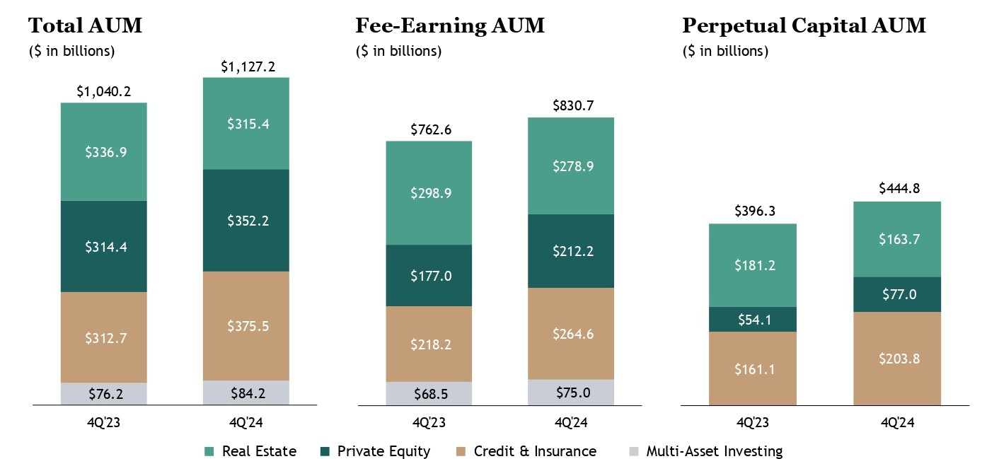

A bar graph compares total asset allocation, fee-earnings, and perpetual capital for four quarters of 2023, highlighting changes in allocation across asset classes.


The chart presents four financial metrics: Total AUM, Fee-Earning AUM, Perpetual Capital AUM, and Multi-Asset Investing. 

**Total AUM (In Billions):**
- Real Estate: $336.9 billion
- Private Equity: $314.4 billion
- Credit & Insurance: $312.7 billion
- Multi-Asset Investing: $76.2 billion

**Fee-Earning AUM (In Billions):**
- Real Estate: $278.9 billion
- Private Equity: $298.9 billion
- Credit & Insurance: $218.2 billion
- Multi-Asset Investing: $75.0 billion

**Perpetual Capital AUM (In Billions):**
- Real Estate: $281.2 billion
- Private Equity: $181.2 billion
- Credit & Insurance: $161.1 billion
- Multi-Asset Investing: $56.1 billion

The chart indicates that Total AUM has grown from $1,040.2 billion in 4Q23 to $1,127.2 billion in 4Q24, representing a 14.5% increase. Fee-Earning AUM has also increased from $376.6 billion in 4Q23 to $782.7 billion in 4Q24, representing a 25.5% increase. Perpetual Capital AUM has grown from $444.8 billion in 4Q24 to $443.8 billion in 4Q23, represent

| Category | Value (in billions) |
|---|---| 
| Total AUM | $1,040.2 |
| Fee-Earning AUM | $762.6 |
| Perpetual Capital AUM | $444.8 |


The chart presents financial data comparing Total AUM, Fee-Earning AUM, and Perpetual Capital AUM across different quarters (4Q23, 4Q24, 4Q23, 4Q24, and 4Q23+). Each category is represented by a different color and includes both Real Estate and Credit & Insurance components. The chart includes detailed breakdowns of Total AUM, Fee-Earning AUM, and Perpetual Capital AUM across various investment types and quarters. The data highlights trends and patterns in investment performance, demonstrating how these metrics evolve over time. The chart also provides key insights, such as comparing the performance of Real Estate and Credit & Insurance across different investment categories and quarters.


In [5]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/Blackstone4Q24Earnings_chart.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°3**

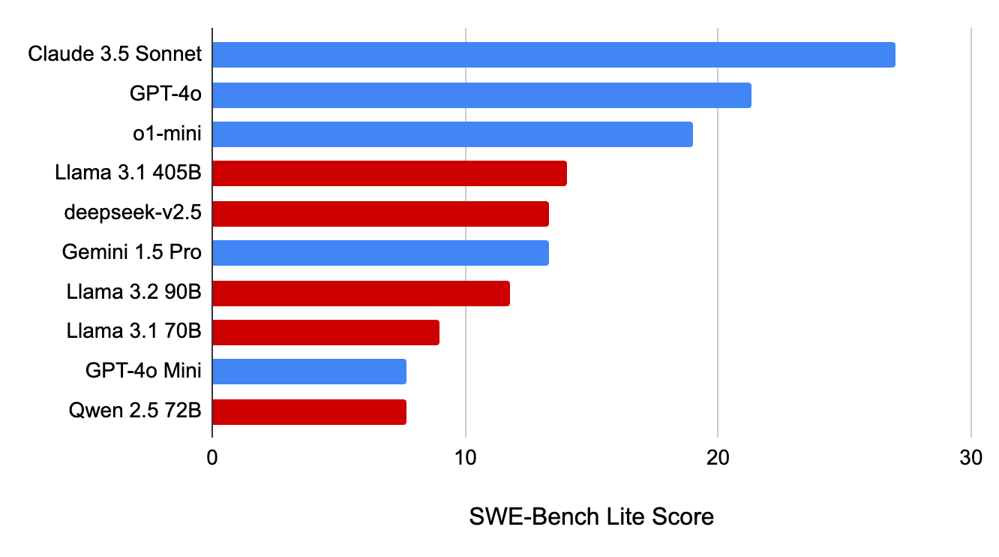

A bar graph displays the SWE-Bench Lite scores for nine different controllers, ranging from Claude 3.5 Sonnet to Qwen 2.5 72B, with GPT-4o o1-mini leading the pack.


The chart displays the SWE-Bench Lite scores for nine different GPT-4o models, arranged in a horizontal bar chart format. The scores are displayed from lowest to highest, with the models listed on the y-axis and the scores on the x-axis. Each bar represents a model, and its height corresponds to its SWE-Bench Lite score. The models include Claude 3.5 Sonnet, α1-mini, Llama 3.1 405B, deepseek-v2.5, Gemini 1.5 Pro, Llama 3.2 90B, Llama 3.1 70B, GPT-4o Mini, and Qwen 2.5 72B. The chart showcases the performance of various GPT-4o models in terms of SWE-Bench Lite, with Claude Sonnet achieving the highest score.


| Label | Value |
|---|---| 
| Claude 3.5 Sonnet | 29 |
| GPT-4o | 21 |
| o1-mini | 18 |
| Llama 3.1 405B | 15 |
| deepseek-v2.5 | 13 |
| Gemini 1.5 Pro | 12 |
| Llama 3.2 90B | 11 |
| Llama 3.1 70B | 10 |
| GPT-4o Mini | 9 |
| Qwen 2.5 72B | 8 |


The chart displays SWE-Bench Lite scores for various GPT-4O models and Llama models. The x-axis represents the SWE-Bench Lite Score, and the y-axis shows the scores of different GPT-4O models and Llama models. The chart includes a legend that explains the color coding for each GPT-4O model and Llama model. The chart also shows trends in scores across different GPT-4O models and Llama models. The chart highlights the performance of different GPT-4O models and Llama models in terms of SWE-Bench Lite scores.


In [6]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/accuracy-bar-chart.png",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°4**

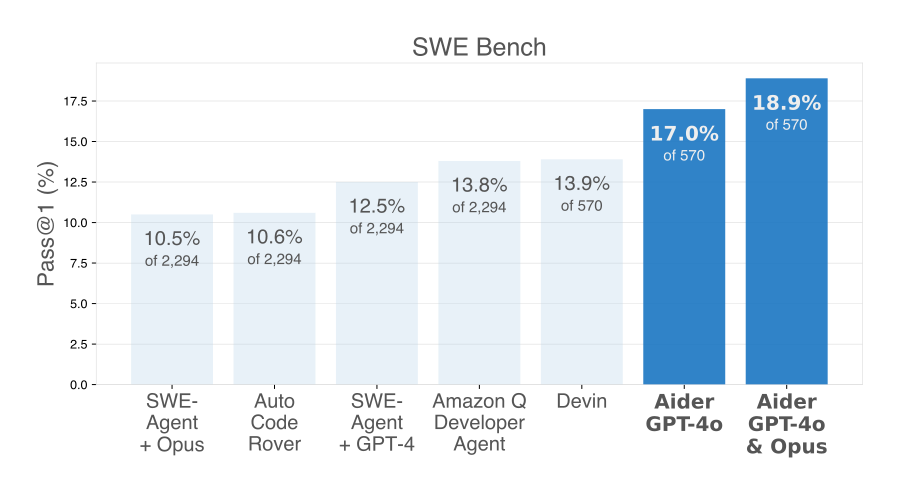

A bar graph titled "SWE Bench" displays the pass percentages for six different developers on the Senior Software Engineer (SWE) bench, ranging from SWE Agent + Opus to Aider GPT-4o & Opus.


The chart shows the pass percentage for the SWE Bench on various platforms. The SWE Bench is a testing platform that assesses developers' skills in software engineering and technology-related areas. The chart compares the pass percentages for developers using different platforms: SWE Agent + Opus, Auto Code Rover, SWE Agent + GPT-4, Amazon Q Developer Agent, Devin, and Aider GPT-4o & Opus. Aider GPT-4o & Opus is the platform that offers the highest pass percentage at 18.9%. The chart also highlights the leading platforms for SWE Bench, with Aider GPT-4o & Opus leading by 570 passes. This indicates that Aider GPT-4o & Opus is a highly effective testing platform for software developers.


| Category | Percentage |
|---|---| 
| SWE Agent + Opus | 10.5% |
| Auto Code Rover | 10.6% |
| SWE Agent + GPT-4 | 12.5% |
| Amazon Q Developer Agent | 13.8% |
| Devin | 13.9% |
| Aider GPT-4o | 17.0% |
| Aider GPT-4o & Opus | 18.9% |


The chart titled "SWE Bench" displays pass percentages for various developers on the SWE bench, ranging from 10.5% to 18.9%. The x-axis lists the developers, while the y-axis shows the pass percentage. The chart shows an overall upward trend in pass percentages, with the highest percentage being 18.9% for Aider GPT-4 & Opus, followed by Devin at 13.9%, and Amazon Q Developer Agent at 13.8%. The lowest pass percentage is 10.5% for SWE Agent + Opus.


In [7]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/swe_bench.png",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°5**

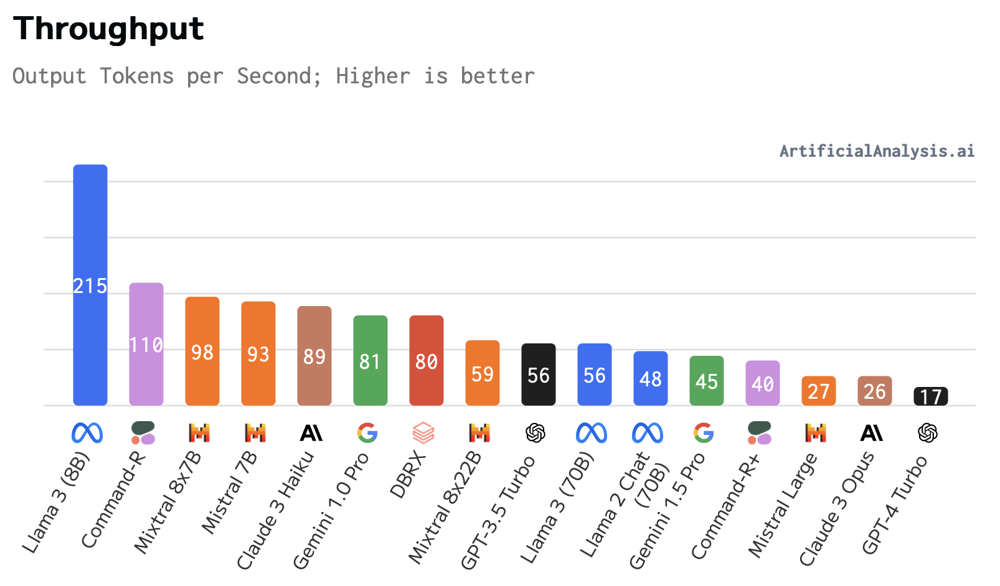

A bar graph titled "Throughput" displays the output Tokens per Second for various text-based applications, with Claude 3 Opus having the fastest and 17 the slowest.


The chart titled "Throughput" displays the output tokens per second for various text-based applications. The applications shown are Llama 3 (8B), Command-R, Mixtral 8x7B, Claude 3 Haiku, Gemini 1.0 Pro, DBRX, Mixtral 8x22B, GPT-3.5 Turbo, Llama 3 (70B), Llama 2 Chat, Gemini 1.5 Pro, Command-R+, Mistral Large, and Claude 3 Opus. Each application is represented by a vertical bar, and the height of each bar indicates the number of output tokens per second. The chart shows that Llama 3 (8B) generates the most output tokens per second, followed by Command-R and Mixtral 8x7B. The chart also includes a legend that explains the color coding for each application. The chart is sourced from ArtificialAnalysis.ai.


| Label | Category | Output Tokens per Second |
|---|---|---| 
| Llama 3 (8B) | 215 | 110 |
| Command-R | 110 | 98 |
| Mixtral 8x7B | 98 | 93 |
| Claude 3 Haiku | 89 | 93 |
| Gemini 1.0 Pro | 81 | 89 |
| DBRX | 80 | 59 |
| Mixtral 8x22B | 56 | 56 |
| GPT-3.5 Turbo | 56 | 56 |
| Llama 3 (70B) | 56 | 56 |
| Llama 2 Chat | 48 | 56 |
| Gemini 1.5 Pro | 45 | 48 |
| Command-R+ | 40 | 45 |
| Mistral Large | 27 | 40 |
| Claude 3 Opus | 26 | 27 |
| GPT-4 Turbo | 17 | 26 |


The chart titled "Throughput" displays output tokens per second for various text-based chat applications. The x-axis lists the applications, while the y-axis shows the number of output tokens per second. 

The chart shows a clear trend of higher throughput with higher output tokens per second. Applications like Llama 3 (8B) have the highest throughput at 215 tokens per second, followed by Command-R at 110 tokens per second. 

The chart also highlights some notable trends:

- Applications like GPT-3.5 Turbo and Claude 3 Opus have lower throughput values, indicating potential performance issues.
- Applications like GPT-4 Turbo have significantly lower throughput values, suggesting they may be less efficient or require better performance.
- Applications like Gemini 1.0 Pro and Claude 3 Haiku have similar throughput values, indicating a possible parity between these applications.

Overall, the chart provides valuable insights into the performance of different text-based chat applications, 

In [8]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/throughput_by_model.png",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°6**

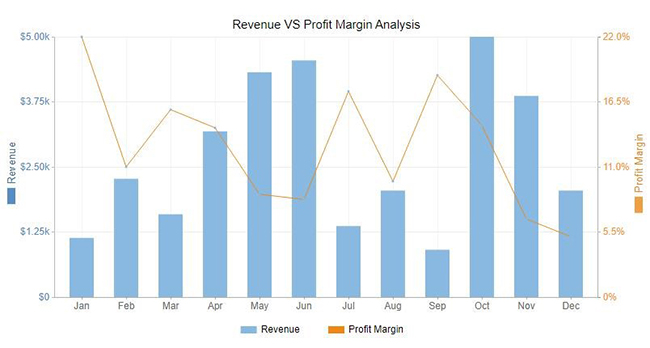

A bar graph titled "Revenue vs Profit Margin Analysis" displays the revenue and profit margins over a 12-month period, with revenue in blue and profit in orange.


The chart titled "Revenue VS Profit Margin Analysis" displays the revenue and profit margins for a business over eleven months. The data is presented as two bars, with the blue bar representing revenue and the orange bar representing profit margin. 

The chart reveals several trends. Revenue generally increases from January to October, with a notable spike in October. Profit, on the other hand, generally increases from January to July, followed by a decrease towards December. 

There is a slight decrease in revenue from July to September, and a slight increase in profit from September to October. However, there is a sharp drop in profit from October to December. 

The chart highlights the correlation between revenue and profit, with higher revenue often associated with higher profit margins. It also includes an orange line representing the "Profit Margin" against a blue background, providing a visual representation of the profit margin over time.


| Category | Value |
|---|---| 
| Revenue | $1,250,000 |
| Profit Margin | $5.5% |


The chart titled "Revenue VS Profit Margin Analysis" displays revenue and profit margin data for a company from January to December. The x-axis represents months, and the y-axis represents revenue and profit margin in thousands of dollars. 

The chart shows two lines: a blue line representing revenue, and a gold line representing profit margin. 

The revenue line fluctuates throughout the year, with peaks in April and October, and valleys in January and September. The profit margin line also fluctuates, with peaks in October and November, and valleys in January and September. 

The chart highlights several key patterns:

1. **Revenue and Profit Margin Trend**: The revenue line shows a generally upward trend, with some fluctuations. The profit margin line also shows a general upward trend, with some dips. 
2. **Revenue and Profit Margin Comparison**: The chart compares the revenue and profit margins for each month, revealing a clear trend of increasing revenue and profit margins from Ja

In [9]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/what-are-financial-graphs.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°7**

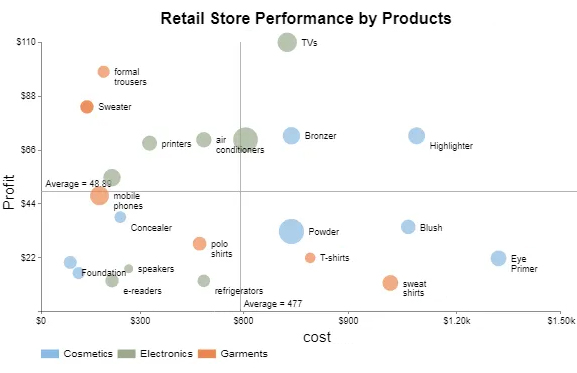

A scatter plot graph compares retail store performance across different product categories, with blue circles representing cosmetics, green squares representing electronics, and orange circles representing garments.


The chart titled "Retail Store Performance by Products" displays a comprehensive view of retail store performance across various products. The chart is organized in a grid format with two columns (cost and profit) and four rows (different product categories). Each product category is represented by a blue circle, and the cost of each product is depicted by a orange circle. The chart also includes gray squares representing electronics products. The chart includes a legend that explains the color coding for each product category. The chart highlights that certain products, such as TVs and air conditioners, often have higher profit margins despite being more expensive compared to cosmetics products. It also shows that products with lower costs, such as high-luster lipsticks, can still perform well in terms of profit. Conversely, products with higher costs, such as premium perfumes, can have a lower profit margin. Despite these challenges, some products, such as germants and high-luster sh

| Product Category | Cost | Profit |
|---|---|---| 
| Cosmetics | $1,500 | $3,200 |
| Electronics | $800 | $4,700 |
| Germents | $500 | $4,500 |


The chart titled "Retail Store Performance by Products" displays a scatter plot of retail store performance metrics across different product categories. The x-axis represents cost, and the y-axis represents profit. 

The chart includes several product categories: Cosmetics, Electronics, Garments, TVs, printers, air conditioners, blush, makeup, foundations, e-readers, polo shirts, sweatshirts, makeup, foundation, eye primer, blush, makeup, foundation, e-readers, speakers, refrigerators, polo shirts, sweatshirts, makeup, foundation, e-readers, speakers, TVs, printers, air conditioners, blush, makeup, foundation, e-readers, speakers, sweatshirts, makeup, foundation, e-readers, speakers, TVs, printers, air conditioners, polo shirts, sweatshirts, makeup, foundation, e-readers, speakers, sweatshirts, makeup, foundation, e-readers, speakers, TVs, printers, air conditioners, blush, makeup, foundation, e-readers, speakers, sweatshirts, makeup, foundation, e-readers, speakers, sweatshirts, makeu

In [10]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/scatter-plot-for-financial-graphs.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°8**

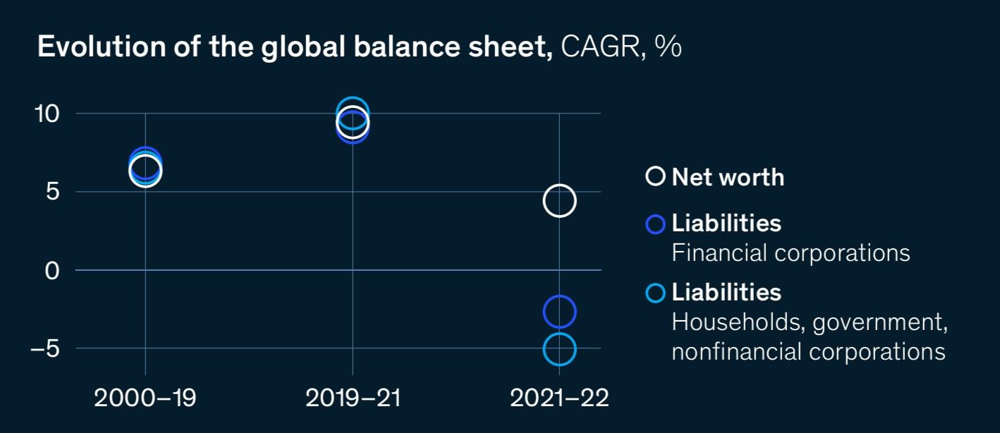

The global balance sheet, represented by a line graph, showcases changes in net worth, liabilities, and nonfinancial corporations from 2000 to 2022, with fluctuations in net worth, liabilities, and nonfinancial corporations.


The chart titled "Evolution of the global balance sheet, CAGR, %" illustrates the changes in the global balance sheet (including net worth, liabilities, and net worth) from 2000 to 2022, categorized by different liability types. The chart uses circular markers to represent the net worth of financial corporations, households, government, and nonfinancial corporations. The net worth of financial corporations has shown a fluctuating trend, overseeing a general decrease from 2000 to 2021, followed by a slight increase in 2022. The net worth of households, government, and nonfinancial corporations has also experienced a decline, reaching a low of -6.2% in 2021. The liabilities of financial corporations have consistently accounted for the largest portion of the global balance sheet, fluctuating between 7.5% and 10.5% over the period. While liabilities for households, government, and nonfinancial corporations have also decreased, they remain a smaller portion of the global balance sheet compa

| Year | Net Worth | Liabilities | Liabilities |
|---|---|---|---| 
| 2000-19 | 5.0 | 6.0 | 6.0 |
| 2019-21 | 10.0 | 9.0 | 9.0 |
| 2021-22 | -5.0 | 6.0 | 6.0 |


The chart titled "Evolution of the global balance sheet, CAGR, %" presents a comparative analysis of three different time periods: 2000-19, 2019-21, and 2021-22. The chart is divided into two main sections: "Liabilities" and "Net worth."

The "Liabilities" section includes categories for financial corporations, households, government, nonfinancial corporations. The chart shows numerical values for each category across these three time periods.

The "Net worth" section includes categories for financial corporations, households, government, nonfinancial corporations. The chart also shows numerical values for each category across these three time periods.

The chart highlights the following key insights:

- Financial corporations have experienced a significant increase in liabilities over the three time periods, rising from 5% in 2000-19 to 10% in 2019-21.
- Households, government, and nonfinancial corporations have seen a decrease in liabilities, from 6% in 2000-19 to 3% in 2021-22.
- Th

In [11]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/plots-and-tables-images/plot_1.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°9**

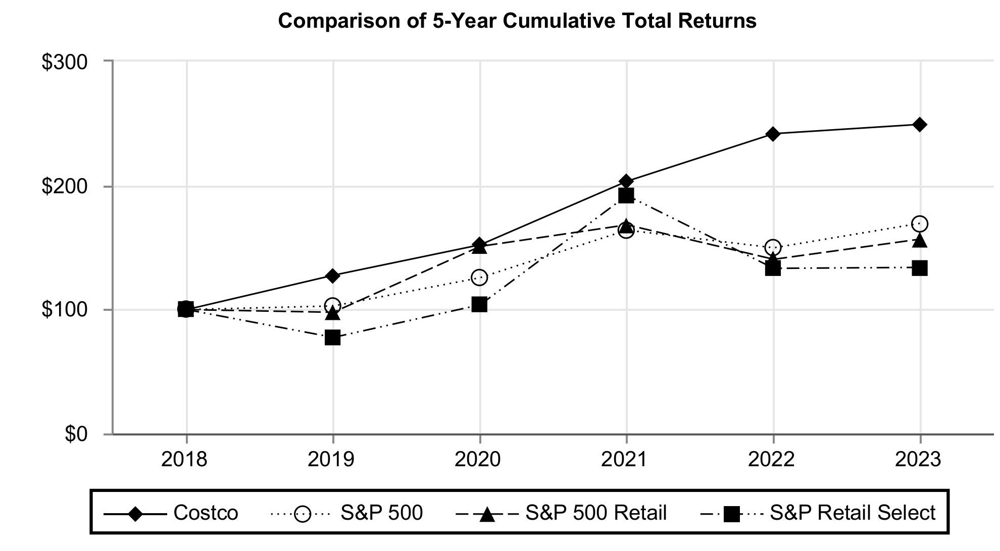

A 5-year cumulative total returns chart compares Costco's S&P 500 Retail selection's performance to the S&P 500 Retail Select's performance, displaying both upward and downward trends.


The line chart titled "Comparison of 5-Year Cumulative Total Returns" compares the cumulative total returns of Costco, S&P 500 Retail, and S&P Retail Select from 2018 to 2023. Costco's return exhibits the most significant upward trend, increasing from $100 in 2018 to over $250 in 2023. S&P 500 Retail's return shows a slower but consistent upward trend, rising from approximately $100 in 2018 to over $150 in 2023. S&P Retail Select's return remains relatively stable, fluctuating between approximately $70 and $150 over the five-year period. The chart highlights Costco's superior performance in terms of cumulative total returns compared to the other three indices over time.  The data reveals that Costco consistently outperforms its competitors in terms of cumulative total return.


| Category | Costco | S&P 500 Retail | S&P 500 Retail Select |
|---|---|---|---| 
| 2018 | $100 | $100 | $100 |
| 2019 | $120 | $120 | $120 |
| 2020 | $150 | $150 | $150 |
| 2021 | $200 | $200 | $200 |
| 2022 | $230 | $230 | $230 |
| 2023 | $250 | $250 | $250 |


The chart titled "Comparison of 5-Year Cumulative Total Returns" compares the cumulative total returns of Costco, S&P 500 Retail, and S&P Retail Select from 2018 to 2023. The chart plots these returns against each year, allowing for a clear comparison of their performance over this five-year period.

The x-axis represents the years, while the y-axis shows the cumulative total returns in dollars. The chart shows distinct trends for each company:

- Costco consistently demonstrates the highest cumulative total returns, increasing steadily from $100 in 2018 to over $250 in 2023.
- S&P 500 Retail exhibits a gradual upward trend, initially showing a slight increase and then stabilizing around $150 in 2023.
- S&P Retail Select shows a fluctuating trend, with notable increases in 2021 and 2022, followed by a slight decrease in 2023.

The chart highlights several key insights:

- Costco consistently outperforms S&P 500 Retail and S&P Retail Select in terms of cumulative total returns.
- The S&

In [12]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/plots-and-tables-images/plot_8.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°10**

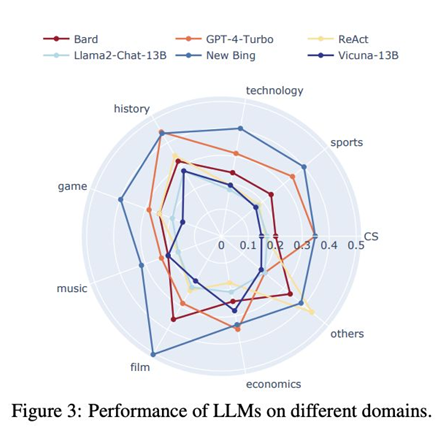

A scatter plot illustrates the performance of different LLMs on various domains, including history, technology, sports, game, music, film, others, and economics.


The chart, titled "Figure 3: Performance of LLMs on different domains,"'s a comprehensive visualization of the performance of four different language learning models (Band, GPT-4 Turbo, ReAct, and Vicuna-13B) on a variety of tasks. The models are displayed using different colors (red, orange, blue, and yellow) to represent their performance. Each domain is labeled clearly below the chart. The chart includes a radius scale around the diagram to illustrate the model's performance across a range of domains, such as history, technology, sports, game, music, economics, and others. The model with the highest performance is shown to be Band, consistently outperforming its competitors across all domains.


| Domain | LLMs | Score |
|---|---|---|
| Bard | 0.2 | 0.4 |
| GPT-4 Turbo | 0.4 | 0.5 |
| ReAct | 0.2 | 0.3 |
| Vicuna-13B | 0.2 | 0.4 |
| New Bing | 0.1 | 0.3 |


This chart titled "Figure 3: Performance of LLMs on different domains" displays a radial plot of performance scores for various LLMs across different domains. The plot uses different colors to represent each LLM's performance and includes numerical values for each domain. The categories on the x-axis include various domains such as "history", "game", "music", "film", "economics", "sports", "others", "technology", and "cs". Each LLM's performance is plotted against its score in the corresponding domain. The chart shows various patterns, trends, and comparisons between the LLMs' performance across different domains.


In [13]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/charts-samples/performance.png",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°11**

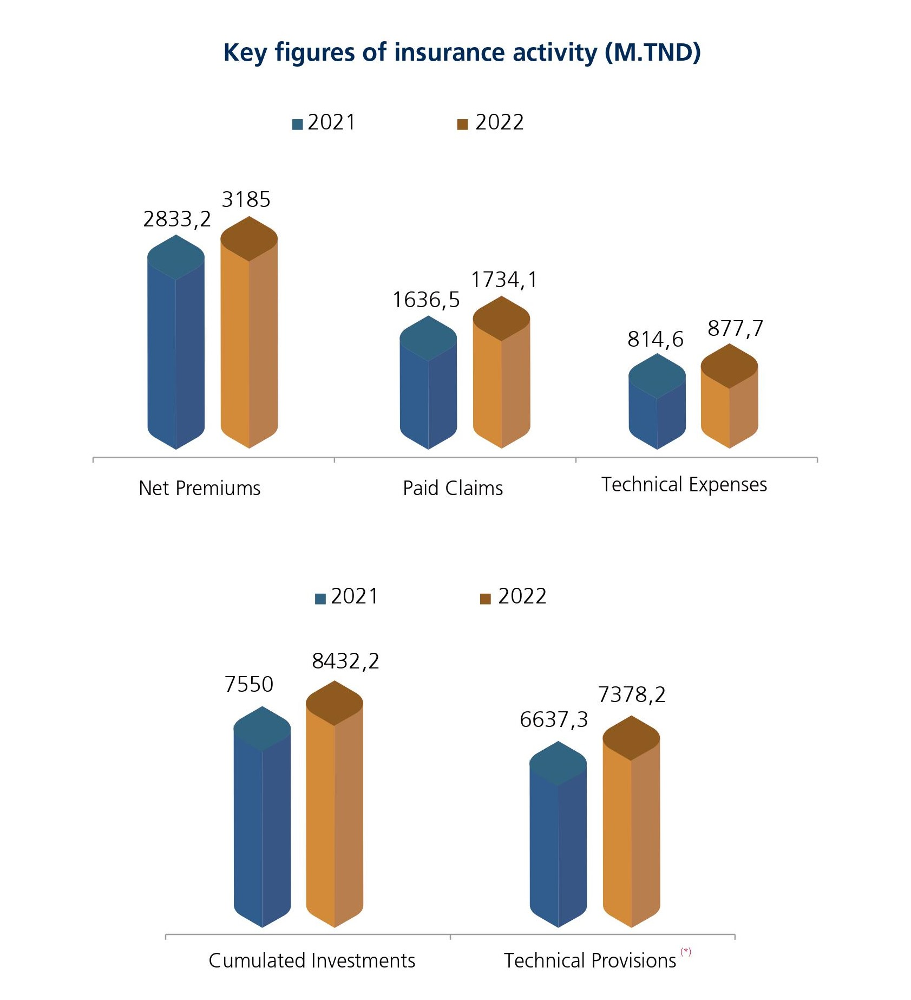

Insurance activity charts for 2021 and 2022, displaying net premiums, paid claims, technical expenses, cumulated investments, and technical provisions in million TND.


The chart titled "Key figures of insurance activity (M.TND)" presents data for two consecutive years, showing net premiums, paid claims, technical expenses, and cumulated investments for both the 2021 and 2022 periods. The chart is divided into six categories: net premiums, paid claims, technical expenses, cumulated investments, technical provisions, and both categories combined. The

The chart highlights several key trends. Net premiums have decreased from 2021 to 2022. Payed claims have also decreased. Technical expenses have decreased. Cumulated investments have increased. Technical provisions have decreased. Net premiums have decreased while paid claims and technical expenses have remained relatively stable.

The chart indicates that insurance activity in the MPTN has shifted towards lower premiums and decreased claims, suggesting potential changes in the insurance market or policy offerings.


| Category | 2021 | 2022 |
|---|---|---|
| Net Premiums | 2833.2 | 3185 |
| Paid Claims | 1636.5 | 1734.1 |
| Technical Expenses | 814.6 | 877.7 |
| Cumulated Investments | 7550 | 8432.2 |
| Technical Provisions | 6637.3 | 7378.2 |


The chart titled "Key figures of insurance activity (M.TND)" presents data on insurance activity in 2021 and 2022, categorized into Net Premiums, Paid Claims, Technical Expenses, Cumulated Investments, and Technical Provisions. 

The chart includes two bars for each category, representing the values for 2021 and 2022. 

Key Insights:

1. **Net Premiums**: The chart shows that net premiums in 2022 were higher than in 2021, increasing by 1,165 million MTND.
2. **Paid Claims**: The chart shows that paid claims in 2022 were higher than in 2021, increasing by 1,180 million MTND.
3. **Technical Expenses**: The chart shows that technical expenses in 2022 were higher than in 2021, increasing by 1,110 million MTND.
4. **Cumulated Investments**: The chart shows that cumulated investments in 2022 were higher than in 2021, increasing by 1,190 million MTND.
5. **Technical Provisions**: The chart shows that technical provisions in 2022 were higher than in 2021, increasing by 1,110 million MTND.

Ove

In [14]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/tables-and-plots-for-testing/bar_plot_cga.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°12**

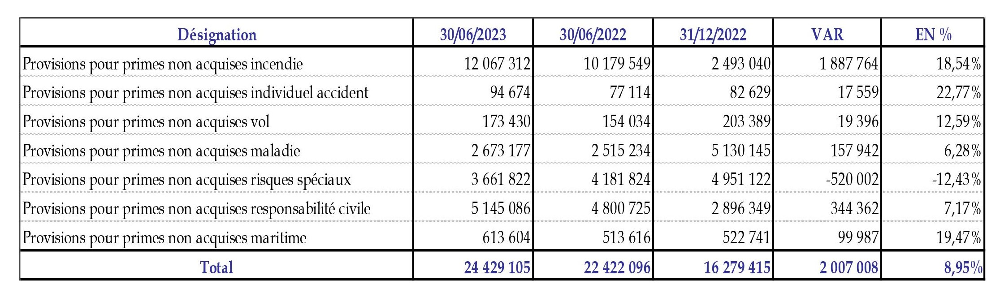

A table displays data on accidents involving prime ministers in France, highlighting the frequency of accidents, the involved parties, and the associated VAR and EN % for June and December 2022.


This table presents data on the number of accidents involving prime ministers of Canada during different time periods. It breaks down the data into four categories: accidents involving prime ministers acquiring a position, other types of accidents, accidents involving prime ministers not acquiring a position, and accidents involving prime ministers in maritime roles. The table includes a total count of accidents for 2022, 2023, and 2024. Additionally, it displays the VAR (Value at Risk) and EN (% (Enforcement Percentage)) for each accident category. The VAR provides the total risk associated with the accident, while the EN (% represents the percentage of accidents that were successfully enforced). The data reveals a slight decrease in accidents involving prime ministers acquiring a position from 2023 to 2024. However, there is an overall increase in the number of accidents across all categories.


| Designation                                          | 30/06/2023 | 30/06/2022 | 31/12/2022 | VAR | EN % |
|-----------------------------------------------------|-----------|-----------|-----------|------|------|
| Provisions pour primes non acquises incendie            | 12 067 312| 10 179 549| 2 493 040| 1 887 764| 18.54%|
| Provisions pour primes non acquises individuel accident | 94 674    | 77 114    | 82 629    | 17 559 | 22.77%|
| Provisions pour primes non acquises vol               | 173 430   | 154 034   | 203 389   | 19 396 | 12.59%|
| Provisions pour primes non acquises maladie              | 2 673 177 | 2 515 234 | 5 130 145 | 157 942 | 6.28%|
| Provisions pour primes non acquises risques spéciaux | 3 661 822 | 4 181 824 | 4 951 122 | -520 002 | -12.43%|
| Provisions pour primes non acquises responsabilité civile | 5 145 086 | 4 800 725 | 2 896 349 | 344 362 | 7.17%|
| Provisions pour primes non acquises maritime             | 613 604   | 513 616   | 522 741   | 99 987 |

This table presents data on accidents involving maritime services, categorized by designations. The trends show a significant decrease in accidents from 2023 to 2022, followed by a slight increase in 2022. The table includes data on VAR (Value at Risk), EN (% (Enforcement Percentage)), and VAR-2 (Value at Risk-2), providing insights into safety improvements and potential risks associated with maritime operations.


In [17]:
visual_query_1 = "Extract the data from the table and represent it as a clean, well-formatted markdown table"
visual_query_2 = "Provide a detailed explanation of the table, including its title, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the table."

analyze_image(
    "/kaggle/input/tables-and-plots-for-testing/cmf_table.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°13**

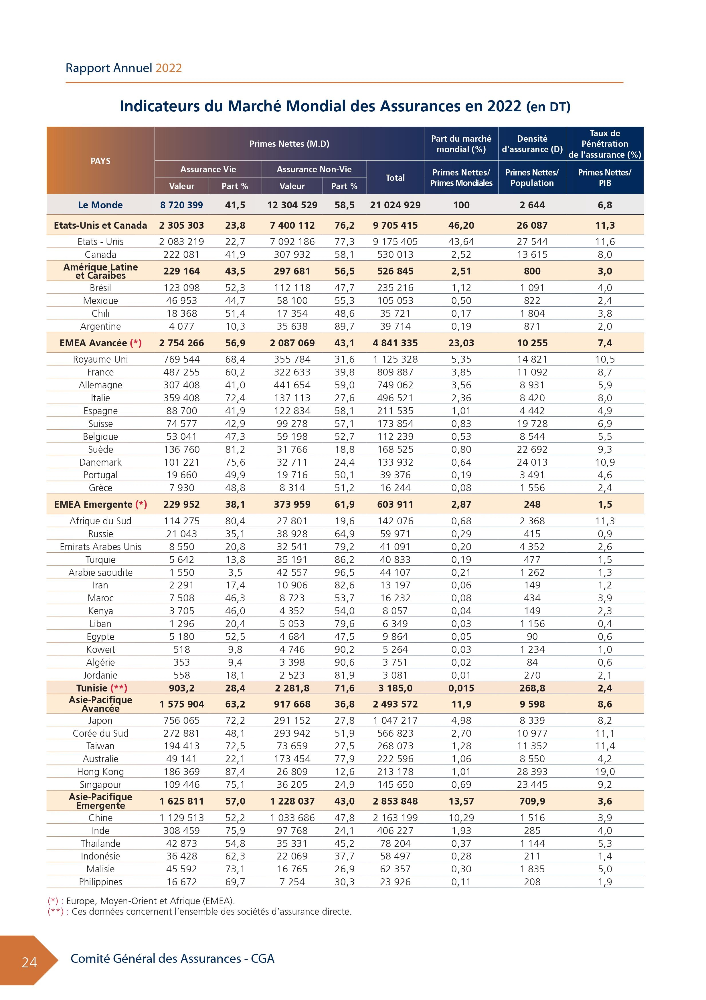

A table titled "Indicateurs du Marché Mondial des Assurances  en 2022" displays data on various insurance companies, including their names, market sizes, and key performance indicators.


The image presents a table titled "Indicateurs du Marché Mondial des Assurances en 2022" (Insurers' Indices on the Global Insurance Market in 2022). The table includes data on various insurance companies, categorized by their pay rates, assurance volumes, and part distributions. It specifically focuses on two main insurance categories: "Le Monde" (Global Insurance) and "EMEA Avance" (Emerging Market) insurance companies. The table provides detailed information such as their names, pay percentages, part distributions, total pay volumes, and part net values for both categories. It also displays the part-by-part volumes of these companies across different dimensions such as primes, part values, and part net values for various countries. The table includes a footnote indicating that the data presented is for insurance companies and that they represent a sample of their societies.


| PAYS | Le Monde | Primes Nettes (M.D.) | Assurance Valeur | Assurance Non-Valeur | Total | Part du marché Primées Nettes/Mondes | Densité de Primaires Nettes/Mondes | Densité de Primaires Nettes/Mondes | Taux de Penetration/Primaire Nettes/Mondes |
|------|---------|------------------|-----------------|-------------------|-------|---------------------------------|---------------------------------|---------------------------------|---------------------------------|
| Etats-Unis et Canadie | 8 720 399 | 41,5 | 12 400 524 | 56,5 | 21 904 929 | 100 | 2 644 | 6,8 |
| Etats-Unis - Canada | 2 305 303 | 22,7 | 7 700 192 | 78,2 | 7 905 415 | 46,24 | 26 087 | 11,3 |
| Etats-Unis - Canada | 222 081 | 29,8 | 307 907 | 77,1 | 530 043 | 43,5 | 27 544 | 8,6 |
| Amérique Latine et Canadie | 229 164 | 43,5 | 297 881 | 56,5 | 526 245 | 2,51 | 1 600 | 3,0 |
| Brasil | 123 058 | 54,2 | 112 136 | 48,7 | 35 316 | 1,12 | 901 | 4,0 |
| Mexique | 46 937 | 50,7 | 57 100 | 45,6 | 105 051 | 0,52 | 1 891 | 2,8 |

This table presents data on insurance premiums for the March of Nations in 2022, categorized by country and region. It displays various metrics including insurance coverage percentages, total premiums, insured populations, and premium per million inhabitants. The table includes data for Le Monde, Emamec, Emamec Energite, and Emamec Energite, allowing for comparisons across different regions and countries. The table also highlights key trends and patterns in insurance premiums, including regional disparities and changes in insurance coverage over time. Overall, the data provides a comprehensive overview of insurance practices and trends in the March of Nations.


In [16]:
visual_query_1 = "Extract the data from the table and represent it as a clean, well-formatted markdown table"
visual_query_2 = "Provide a detailed explanation of the table, including its title, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the table."

analyze_image(
    "/kaggle/input/tables-and-plots-for-testing/cga_other_table.jpg",
    model,
    visual_query_1,
    visual_query_2
)

## **Example n°14**

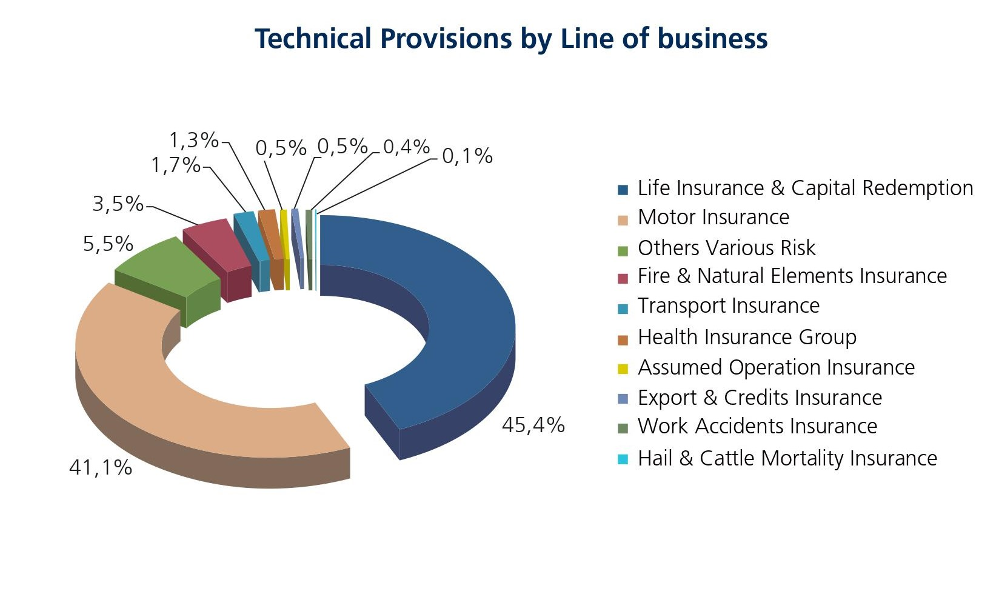

A pie chart illustrates the technical provisions by line of business, with Life Insurance & Capital Redemption leading at 45%, followed by Motor Insurance at 41%, and other lines at 28%.


This pie chart, titled "Technical Provisions by Line of Business," illustrates the distribution of various insurance types among different business lines. Life Insurance & Capital Redemption accounts for the largest share at 45.4%, followed by Motor Insurance at 41.1%. Motor Insurance represents 5.9% of the total, while others include Others Various Risk, Fire & Natural Elements Insurance, Transport Insurance, Health Insurance Group, Assumed Operation Insurance, Export & Credits Insurance, and Hail & Cattle Mortality Insurance. The chart reveals that the insurance industry is diverse, with a significant reliance on motor insurance, highlighting the importance of this category to these businesses. Additionally, the chart indicates a relatively small proportion of insurance services offered in other business lines, such as fire & natural elements, export & credits, and hail & cattle mortality insurance.


| Label | Percentage |
|---|---| 
| Life Insurance & Capital Redemption | 45% |
| Motor Insurance | 41% |
| Others Various Risk | 5% |
| Fire & Natural Elements Insurance | 1.3% |
| Transport Insurance | 0.5% |
| Health Insurance Group | 0.5% |
| Assumed Operation Insurance | 0.4% |
| Export & Credits Insurance | 0.3% |
| Hail & Cattle Mortality Insurance | 0.2% |


The chart titled "Technical Provisions by Line of Business" displays the distribution of technical services across different business lines. The chart is divided into several sections, each representing a different type of technical service. The pie chart is divided into eight segments, each representing a different business line. The segments are color-coded and labeled with their corresponding percentages. The chart also includes a list of technical services and their corresponding percentages. The chart highlights the dominance of life insurance & capital redemption, motor insurance, and other technical services in the business landscape. The chart also shows the decreasing trend in the use of other technical services. The chart provides a clear visual representation of the distribution of technical services across different business lines.


In [18]:
visual_query_1 = "Extract the data from the chart and represent it as a clean, well-formatted markdown table. Include all labels, categories, and values exactly as they appear in the image."
visual_query_2 = "Provide a detailed explanation of the chart, including its title, axes, categories, trends, and all numerical values shown in the image. Highlight patterns, comparisons, and key insights using the actual numbers from the chart."

analyze_image(
    "/kaggle/input/tables-and-plots-for-testing/donut_plot.jpg",
    model,
    visual_query_1,
    visual_query_2
)

# Conclusion 📝

Overall, **Moondream2** generates good interpretations of charts and tables. It is especially strong at providing **detailed explanations**, identifying trends, and referencing numerical values present in the images.  

However, the model **struggles when asked to extract the content into a Markdown table**, particularly with **complex charts and tables**. As observed, the **precision of the prompt** plays a crucial role in getting accurate outputs — the more specific and structured the prompt, the better the model performs.  